# T&D Clusterization

Este notebook tem como objetivo realizar todos os passos até a execução de um modelo de aprendizado de máquina de clusterização com o objetivo de identificar os consumidores felizes ou tristes de acordo com as avaliações realizadas.

O dataset utilizado é uma base de dados de uma loja brasileira de ecommerce, disponível em: [Link do Dataset](https://www.kaggle.com/datasets/olistbr/brazilian-ecommerce)
 
Os passos definidos são:
1. Importação de dados e formação de tabelas delta;
2. Análise de dados & formação da tabela base de clusterização;
3. Pré-processamento e feature selection;
4. Clusterização;
5. Avaliação e análise dos clusters;
6. Conclusão.

**Este notebook pertence a:** eric.yoshida 

Links:
**[GitHub](https://github.com/faduzin)**
**[LinkedIn](https://www.linkedin.com/in/ericfadul/)**

## Importação de dados e formação de tabelas delta

In [0]:
import pyspark
import pyspark.sql.functions as F
import pyspark.mllib
import os

In [0]:
# Verificando se o arquivo foi salvo corretamente
display(dbutils.fs.ls("dbfs:/FileStore/tables/brazilian_ecommerce/"))

path,name,size,modificationTime
dbfs:/FileStore/tables/brazilian_ecommerce/olist_customers_dataset.csv,olist_customers_dataset.csv,9033957,1748795381000
dbfs:/FileStore/tables/brazilian_ecommerce/olist_geolocation_dataset.csv,olist_geolocation_dataset.csv,61273883,1748795392000
dbfs:/FileStore/tables/brazilian_ecommerce/olist_order_items_dataset.csv,olist_order_items_dataset.csv,15438671,1748795384000
dbfs:/FileStore/tables/brazilian_ecommerce/olist_order_payments_dataset.csv,olist_order_payments_dataset.csv,5777138,1748795386000
dbfs:/FileStore/tables/brazilian_ecommerce/olist_order_reviews_dataset.csv,olist_order_reviews_dataset.csv,14451670,1748795389000
dbfs:/FileStore/tables/brazilian_ecommerce/olist_orders_dataset.csv,olist_orders_dataset.csv,17654914,1748795393000
dbfs:/FileStore/tables/brazilian_ecommerce/olist_products_dataset.csv,olist_products_dataset.csv,2379446,1748795393000
dbfs:/FileStore/tables/brazilian_ecommerce/olist_sellers_dataset.csv,olist_sellers_dataset.csv,174703,1748795393000
dbfs:/FileStore/tables/brazilian_ecommerce/product_category_name_translation.csv,product_category_name_translation.csv,2613,1748795394000


In [0]:
path = "dbfs:/FileStore/tables/brazilian_ecommerce/"

file_name_map = {
    'olist_customers_dataset.csv'           : 'customers',
    'olist_geolocation_dataset.csv'         : 'geolocation',
    'olist_order_items_dataset.csv'         : 'items',
    'olist_order_payments_dataset.csv'      : 'payments',
    'olist_order_reviews_dataset.csv'       : 'reviews',
    'olist_orders_dataset.csv'              : 'orders',
    'olist_products_dataset.csv'            : 'products',
    'olist_sellers_dataset.csv'             : 'sellers',
    'product_category_name_translation.csv' : 'product_translation'
}

In [0]:
# File location and type
def save_as_delta(path, name, infer_schema="true", first_row_is_header="true", delimiter=","):
    file_type = "csv"

    # The applied options are for CSV files. For other file types, these will be ignored.
    df = (
        spark.read.format(file_type)
        .option("inferSchema", infer_schema)
        .option("header", first_row_is_header)
        .option("sep", delimiter)
        .load(path)
    )
    spark.sql("CREATE SCHEMA IF NOT EXISTS brazillian_ecommerce")
    df.write.format("delta").mode("overwrite").option("overwriteSchema", "true").saveAsTable(f"brazillian_ecommerce.{name}")

In [0]:
for file in dbutils.fs.ls(path):
    save_as_delta(file.path, file_name_map.get(file.name))

In [0]:
%sql show tables in brazillian_ecommerce


database,tableName,isTemporary
brazillian_ecommerce,customers,false
brazillian_ecommerce,geolocation,false
brazillian_ecommerce,items,false
brazillian_ecommerce,orders,false
brazillian_ecommerce,payments,false
brazillian_ecommerce,product_translation,false
brazillian_ecommerce,products,false
brazillian_ecommerce,reviews,false
brazillian_ecommerce,sellers,false


## Análise de dados & formação da tabela base de clusterização

### Tabelas

In [0]:
CUSTOMERS            = "brazillian_ecommerce.customers"
LOCATION             = "brazillian_ecommerce.geolocation"
ITEMS                = "brazillian_ecommerce.items"
ORDERS               = "brazillian_ecommerce.orders"
PAYMENTS             = "brazillian_ecommerce.payments"
PRODUCTS_TRANSLATION = "brazillian_ecommerce.product_translation"
PRODUCTS             = "brazillian_ecommerce.products"
REVIEWS              = "brazillian_ecommerce.reviews"
SELLERS              = "brazillian_ecommerce.sellers"

In [0]:
customers_df = spark.table(CUSTOMERS)
location_df  = spark.table(LOCATION)
items_df     = spark.table(ITEMS)
orders_df    = spark.table(ORDERS)
payments_df  = spark.table(PAYMENTS)
products_df  = spark.table(PRODUCTS)
reviews_df   = spark.table(REVIEWS)
sellers_df   = spark.table(SELLERS)

### Análise de dados

**Diagrama de relações**

![Relations](https://i.imgur.com/HRhd2Y0.png)

Conteúdo das tabelas:
- _brazillian_ecommerce.customers_: ID do usuário, CEP, cidade, estado;
- _brazillian_ecommerce.geolocation_: coordenadas da localização em função do CEP;
- _brazillian_ecommerce.items_: ID de ordem, quantidade do item, ID de produto, ID de vendedor, data limite de entrega, preço, peso;
- _brazillian_ecommerce.orders_: ID de ordem, ID de consumidor, status da ordem, timestamp da compra, data de aprovação, data de envio, data de recebimento, data de entrega estimada;
- _brazillian_ecommerce.payments_: ID de ordem, sequência de pagamento, tipo de pagamento, quantidade de installments, valor de pagamento;
- _brazillian_ecommerce.product_translation_: nome da categoria em português, nome da categoria em ingles;
- _brazillian_ecommerce.products_:ID do produto, categoria do produto, tamanho do nome do produto, tamanho da descrição do produto, quantidade de fotos do produto, peso em gramas, profundidade, altura, largura;
- _brazillian_ecommerce.reviews_: ID de avaliação, ID de ordem, nota, título de comentário, mensagem do comentário, data de avaliação, data de resposta;
- _brazillian_ecommerce.sellers_: ID de vendedor, CEP, cidade, estado;

A análise de tabelas mostra que:
1. A tabela customer somente contém dados referentes a localização do consumidor, ela não será utilizada no treinamento mas poderá ser utilizada para análise de viés geográfico apos a clusterização;
2. A tabela geolocation possivelmente será utilizada para análise de viés geográfico;
3. A tabela items será utilizada para identificar os items das ordens avaliadas;
4. A tabela orders será utilizada para identificar datas relacionadas a ordem avaliada;
5. A tabela payments será utilizada para identificar o tipo e valor de pagamento;
6. A tabela product será utilizada para identificar a categoria, peso e dimensões do produto;
7. A tabela reviews será a tabela base, pois contém informações de avaliação da compra.
8. A tabela sellers, semelhante a customers, possivelmente será utilizada para identificar viés geográfico.

### Formação da tabela base

Possibilidades:
- Criar uma coluna de delay de entrega, e então classificar como "no prazo", "atrasado", "antes do prazo", "não entregue" e utilizar tambem o order_status como classe: Para esse caso seria necessário utilizar um one hot encode, o que poderia gerar muitas features.
- Retirar pedidos não entregues da lista para utilizar o delay de entrega como um valor continuo: Seria necessário desconsiderar entregar que foram apenas aprovadas mas não enviadas ainda, e entregas canceladas tambémm.
- Remover dimensões do produto e manter somente o freight.
- Manter o tipo de pagamento e usar one hot encode, utilizar a quantidade de pagamentos e o valor total tambem.

In [0]:
# Expressões e definições

timestamp_pattern = "\d{4}-\d{2}-\d{2} \d{2}:\d{2}:\d{2}"

In [0]:
reviews_df = (
    reviews_df
    .filter(
        (F.col("review_score").isNotNull()) &
        (F.col("review_score").rlike("^[0-5]$")) &
        (F.col("review_creation_date").isNotNull()) &
        (F.col("review_creation_date").rlike(timestamp_pattern)) &
        (F.col("review_answer_timestamp").isNotNull()) &
        (F.col("review_answer_timestamp").rlike(timestamp_pattern))
    )
    .withColumn("review_score", F.col("review_score").cast("int"))
    .withColumn("review_creation_date", F.col("review_creation_date").cast("timestamp"))
    .withColumn("review_answer_timestamp", F.col("review_answer_timestamp").cast("timestamp"))
    .withColumn("answer_delay", F.timestamp_diff("hour", F.col('review_creation_date'), F.col('review_answer_timestamp')))
    .drop('review_creation_date', 'review_answer_timestamp', 'review_comment_title','review_comment_message', 'answer_delay') # correlação muito baixa, provavel ruido, assim a medida foi descartada
)

In [0]:
items_df = (
    items_df
    .groupBy("order_id", "product_id", "seller_id", "price", "freight_value")
    .agg(F.max(F.col("order_item_id")).alias("item_quantity"))
)

In [0]:
payments_df = (
    payments_df
    .groupBy("order_id", "payment_installments")
    .agg(F.sum(F.col("payment_value")).alias("total_paid"))
)

In [0]:
cluster_df = (
    reviews_df
    .join(orders_df, on='order_id', how='left')
    .join(payments_df, on='order_id', how='left')
    .join(items_df, on='order_id', how='left')
    .join(products_df, on='product_id', how='left')
)

In [0]:
display(cluster_df.limit(10))

product_id,order_id,review_id,review_score,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,payment_installments,total_paid,seller_id,price,freight_value,item_quantity,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm
3af4f5bb8b0616387fe23646fa94e256,937d5309f2f6bc3548d704f56ef83ed1,2cec2c7a5711c86d5827a5677adfb2a2,1,0738d18b6c59edcbd519a88a06569847,delivered,2018-03-17T16:17:21Z,2018-03-17T16:32:26Z,2018-03-20T15:48:59Z,2018-04-19T23:41:17Z,2018-04-12T00:00:00Z,6,299.7,1025f0e2d44d7041d6cf58b6550e0bfa,229.0,70.7,1,moveis_decoracao,54,769,1,11600,45,35,45
f68980d7981fcc92059f42a4fd82fb38,a4fa719430167664811c30680941ec40,937804d7a75c25090020af23e32afe48,5,a240ccd156413c662c6b890586035887,delivered,2018-08-06T20:56:23Z,2018-08-06T21:05:18Z,2018-08-09T15:07:00Z,2018-08-16T19:38:25Z,2018-08-21T00:00:00Z,1,315.18,634964b17796e64304cadf1ad3050fb7,290.0,25.18,1,esporte_lazer,56,1531,1,650,34,15,12
null,cb4a79c1e6c9ae44302861e7602cc449,4d3c61768eb47216ecf732bbbd8bef3c,1,536f46cc0f2f2b1e40d056f7998f0254,unavailable,2017-12-06T15:46:07Z,2017-12-06T15:57:29Z,null,null,2018-01-03T00:00:00Z,1,66.02,null,null,null,null,null,null,null,null,null,null,null,null
d1c427060a0f73f6b889a5c7c61f2ac4,f9e4b658b201a9f2ecdecbb34bed034b,228ce5500dc1d8e020d8d1322874b6f0,5,e226dfed6544df5b7b87a48208690feb,delivered,2018-02-03T09:56:22Z,2018-02-03T10:33:41Z,2018-02-06T16:18:28Z,2018-02-16T17:28:48Z,2018-03-09T00:00:00Z,1,194.12,a1043bafd471dff536d0c462352beb48,149.0,45.12,1,informatica_acessorios,59,1893,1,6550,20,20,20
224f4ce3262279a31db214df54befe1b,5981f36992c8a99eff941a3d3375b318,3106ee243874b0e10208c710cc248ccc,1,58c52c26686328bb3ee2a91b61187f84,delivered,2018-03-30T22:06:07Z,2018-04-03T05:48:47Z,2018-04-12T22:12:06Z,2018-05-15T19:11:32Z,2018-04-25T00:00:00Z,1,84.92,06a2c3af7b3aee5d69171b0e14f0ee87,61.99,22.93,1,beleza_saude,56,608,1,350,19,12,13
f9259c9e7c0f12c70f7a81409680a5ff,65e560b80ca884377880a124eb79a349,1be3e4747e1007cc28d78719cb204e2c,5,0bb10a5c4a815deda21cde1c4131e90a,delivered,2017-11-24T21:16:37Z,2017-11-28T03:47:18Z,2017-11-28T20:26:55Z,2017-12-13T00:59:45Z,2017-12-18T00:00:00Z,1,86.15,3db66a856d18a9cba7c9241fc5221c50,69.9,16.25,1,esporte_lazer,45,407,2,925,52,21,33
7304acc3196eb4cb479464c421de747f,f351c922b3d5947bcadbeeab096796b8,ec6ac3d1848949b17ffdf3350f6ac1b0,4,259d4795add79a2b1ea46f0210db8766,delivered,2017-11-08T19:39:09Z,2017-11-08T20:30:59Z,2017-11-13T19:48:51Z,2017-11-24T14:09:02Z,2017-11-30T00:00:00Z,6,403.95,54965bbe3e4f07ae045b90b0b8541f52,375.0,28.95,1,cama_mesa_banho,46,729,1,7700,20,30,30
9e9289854d376ff8dc6d8200e4d1d754,741b425678e8c634fa376c96f689256d,55dbb62b22b044b6fe41e767fc5d8eb1,3,fa7b2ad9e0410733cf18a62fe3d6568e,delivered,2018-05-15T19:08:08Z,2018-05-15T19:36:00Z,2018-05-16T16:36:00Z,2018-05-23T16:09:45Z,2018-06-05T00:00:00Z,1,68.83,276677b5d08786d5dce7c2149dcce48b,45.9,22.93,1,ferramentas_jardim,60,208,4,1214,30,17,17
e106c818f2f2e0a830fa2bc5c09076d7,825318ce17c91088b4b6a3ece5aa5222,3a0fd124d55874a20994ba75d0f57c67,1,f2d18f78afede737e736f6aef5282bd9,delivered,2018-06-18T14:46:06Z,2018-06-18T15:01:55Z,2018-06-21T09:37:00Z,2018-06-26T06:24:25Z,2018-07-18T00:00:00Z,8,347.31,2305ab43e846518f58dd9d59f3f54e96,329.9,17.41,1,perfumaria,33,561,1,381,19,13,15
eb8c629f70275fd1c4f809116cce1efc,cd8676507ccbfc96f9e0908910b9e0bb,c5312e197bed58ccb51d461227258136,5,ab4764e19b0376c21427606045dc6ca9,delivered,2017-11-29T13:47:30Z,2017-12-01T11:32:12Z,2017-12-06T22:07:06Z,2017-12-13T13:18:02Z,2017-12-27T00:00:00Z,1,163.53,1025f0e2d44d7041d6cf58b6550e0bfa,38.4,16.11,3,moveis_decoracao,51,831,1,1400,20,30,20


In [0]:
def delay(col1, col2, unit="day"):
    return F.timestamp_diff(unit, F.col(col1), F.col(col2))

In [0]:
display(
    cluster_df
    .withColumn("approval_delay", delay("order_purchase_timestamp", "order_approved_at", "hour"))
    .withColumn("delivered_delay", delay("order_delivered_customer_date", "order_estimated_delivery_date"))
    .withColumnRenamed("order_item_id", "item_quantity")
    .withColumn("total_price", F.round(F.col("item_quantity") * F.col("price"), 2))
    .withColumn("price_variation", F.round(F.col("total_paid") - F.col("total_price"), 2))
    .withColumn("delivery_status",
                F.when(F.col("delivered_delay") < 0, "adiantada")
                .when(F.col("delivered_delay") == 0, "no prazo")
                .when(F.col("delivered_delay") > 20, "muito atrasada")
                .when(F.col("delivered_delay") > 0, "atrasada")
                .otherwise("não entregue"))
    .select("order_id", "customer_id", "seller_id", "review_score", "order_status", "approval_delay", "delivery_status", "payment_installments", "price", "item_quantity", "total_price", "total_paid", "price_variation", "freight_value", "product_weight_g")
    .distinct()
    .filter(
        (F.col("seller_id").isNotNull()) &
        (F.col("approval_delay").isNotNull()) &
        (F.col("total_paid").isNotNull()) &
        (F.col("product_weight_g").isNotNull())    
        )
    .describe()
)

summary,order_id,customer_id,seller_id,review_score,order_status,approval_delay,delivery_status,payment_installments,price,item_quantity,total_price,total_paid,price_variation,freight_value,product_weight_g
count,98611,98611,98611,98611,98611,98611,98611,98611,98611,98611,98611,98611,98611,98611,98611
mean,null,null,null,4.10267617202949,null,9.898327772763688,null,2.950989240551257,124.21468882780997,1.1471945320501769,136.2337033393748,161.46047165123622,25.226768311851714,20.122830211639997,2085.538459198264
stddev,null,null,null,1.331235307164092,null,20.854459334467176,null,2.7406507483969973,187.58069995084935,0.5536473760154406,207.04411391990882,216.74255663220967,54.82795658037874,15.884465952069602,3740.963046127635
min,00010242fe8c5a6d1ba2dd792cb16214,00012a2ce6f8dcda20d059ce98491703,0015a82c2db000af6aaaf3ae2ecb0532,1,approved,0,adiantada,0,0.85,1,0.85,0.01,-3763.56,0.0,0
max,fffe41c64501cc87c801fd61db3f6244,ffffa3172527f765de70084a7e53aae8,ffff564a4f9085cd26170f4732393726,5,unavailable,784,não entregue,24,6735.0,21,13440.0,13664.08,2245.5,409.68,40425


In [0]:
base_cluster_df = (
    cluster_df
    .withColumn("approval_delay", delay("order_purchase_timestamp", "order_approved_at", "hour"))
    .withColumn("delivered_delay", delay("order_delivered_customer_date", "order_estimated_delivery_date"))
    .withColumnRenamed("order_item_id", "item_quantity")
    .withColumn("total_price", F.round(F.col("item_quantity") * F.col("price"), 2))
    .withColumn("price_variation", F.round(F.col("total_paid") - F.col("total_price"), 2))
    .withColumn("delivery_status",
                F.when(F.col("delivered_delay") < 0, "adiantada")
                .when(F.col("delivered_delay") == 0, "no prazo")
                .when(F.col("delivered_delay") > 20, "muito atrasada")
                .when(F.col("delivered_delay") > 0, "atrasada")
                .otherwise("não entregue"))
    .select("order_id", "customer_id", "seller_id", "review_score", "order_status", "approval_delay", "delivery_status", "payment_installments", "price", "item_quantity", "total_price", "total_paid", "price_variation", "freight_value", "product_weight_g")
    .distinct()
    .filter(
        (F.col("seller_id").isNotNull()) &
        (F.col("approval_delay").isNotNull()) &
        (F.col("total_paid").isNotNull()) &
        (F.col("product_weight_g").isNotNull())    
        )
)

In [0]:
display(base_cluster_df)

order_id,customer_id,seller_id,review_score,order_status,approval_delay,delivery_status,payment_installments,price,item_quantity,total_price,total_paid,price_variation,freight_value,product_weight_g
b513b10ef81dc22d15e850789a8a96b1,fa3c9c28979e812523cac4180cf5bbca,b410bdd36d5db7a65dcd42b7ead933b8,5,delivered,33,atrasada,1,179.0,1,179.0,197.53,18.53,18.53,2841
2d58f989c5e9344556ea2a9526699249,1fc09040150013ea0ef014f02dcb4e97,2e1c9f22be269ef4643f826c9e650a52,5,delivered,0,atrasada,10,89.99,1,89.99,106.38,16.39,16.39,600
a92225110bfd8206a036f272ccf0fb1b,7f96cdc06aa0cfe77e71187d5035f22f,6560211a19b47992c3666cc44a7e94c0,5,delivered,0,atrasada,3,49.0,1,49.0,67.23,18.23,18.23,250
d17a342bb9f94d40c3b6df4a600b5cee,511dfb4f5249ddae8cec62d7c650859c,b76dba6c951ab00dc4edf0a1aa88037e,5,delivered,0,atrasada,1,29.99,2,59.98,74.76,14.78,7.39,150
8dd9758206f8d9c23baf77b965e1c6dc,849d4f35271a07987c6af0c676c5ca31,cc419e0650a3c5ba77189a1882b7556a,5,delivered,0,no prazo,1,84.99,1,84.99,100.34,15.35,15.35,600
7c4281b08578a1e5e13e56814b3c6123,686ba249f6f98cc2610b58e5b9982e6a,cfb1a033743668a192316f3c6d1d2671,5,delivered,0,muito atrasada,10,157.0,1,157.0,175.0,18.0,18.0,1700
2b9c1a6934f2dd62cbe6df11189fb65f,82c5e6b98e498b4150818c913f3e9bc7,88460e8ebdecbfecb5f9601833981930,5,delivered,0,atrasada,1,74.9,1,74.9,87.55,12.65,12.65,180
0b93ff37e8344c6013bad16484c7fbe4,41b40faae6aeea7a8b6884948863386e,b19f3ca2ea475913750f25a5c37c8d8f,5,delivered,27,atrasada,10,998.9,1,998.9,1221.28,222.38,222.38,21800
b311d7dd519074ae07f219467efbcc6c,958cac30fa94b05f7747e91ed8798ef8,213b25e6f54661939f11710a6fddb871,5,delivered,0,atrasada,1,79.9,1,79.9,89.37,9.47,9.47,800
f9b9c3c69ef08b6eda32ed086133abb6,2ee87cede5826cd6458393028d3ec739,4b9750c8ad28220fe6702d4ecb7c898f,5,delivered,0,atrasada,3,48.9,1,48.9,58.64,9.74,9.74,600


### Pré-processamento & Feature selection

In [0]:
from pyspark.ml.feature import StringIndexer, OneHotEncoder, StandardScaler, VectorAssembler, PCA
from pyspark.ml import Pipeline

In [0]:


indexer = StringIndexer(
    inputCol="delivery_status", 
    outputCol="delivery_status_index"
    )

encoder = OneHotEncoder(
    inputCol="delivery_status_index", 
    outputCol="delivery_status_vector"
    )

continuous_features = [
    "review_score",
    "payment_installments", 
    "price", 
    "price_variation", 
    "freight_value" 
]

continuous_assembler = VectorAssembler(
    inputCols=continuous_features,
    outputCol="continuous_features"
)

scaler = StandardScaler(
    inputCol="continuous_features", 
    outputCol="scaled_features", 
    withMean=True, 
    withStd=True
    )

all_features = [ 
    "delivery_status_vector",
    "scaled_features"
]

assembler = VectorAssembler(
    inputCols=all_features,
    outputCol="selected_features"
)

pipeline = Pipeline(stages=[indexer, encoder, continuous_assembler, scaler, assembler])

model = pipeline.fit(base_cluster_df)
preprocessed_cluster_df = model.transform(base_cluster_df)

Uploading artifacts:   0%|          | 0/4 [00:00<?, ?it/s]

🏃 View run adorable-rat-791 at: https://community.cloud.databricks.com/ml/experiments/4003234034758612/runs/1652ec53f6cb40af9bf9708493db770e
🧪 View experiment at: https://community.cloud.databricks.com/ml/experiments/4003234034758612


In [0]:
display(preprocessed_cluster_df)

order_id,customer_id,seller_id,review_score,order_status,approval_delay,delivery_status,payment_installments,price,item_quantity,total_price,total_paid,price_variation,freight_value,product_weight_g,delivery_status_index,delivery_status_vector,continuous_features,scaled_features,prediction
b513b10ef81dc22d15e850789a8a96b1,fa3c9c28979e812523cac4180cf5bbca,b410bdd36d5db7a65dcd42b7ead933b8,5,delivered,33,atrasada,1,179.0,1,179.0,197.53,18.53,18.53,2841,0.0,"Map(vectorType -> sparse, length -> 4, indices -> List(0), values -> List(1.0))","Map(vectorType -> dense, length -> 5, values -> List(5.0, 1.0, 179.0, 18.53, 18.53))","Map(vectorType -> dense, length -> 5, values -> List(0.6740535074013801, -0.7118707999158181, 0.29206262257543913, -0.12214149002679028, -0.1002759687638186))","Map(vectorType -> dense, length -> 9, values -> List(1.0, 0.0, 0.0, 0.0, 0.6740535074013801, -0.7118707999158181, 0.29206262257543913, -0.12214149002679028, -0.1002759687638186))"
2d58f989c5e9344556ea2a9526699249,1fc09040150013ea0ef014f02dcb4e97,2e1c9f22be269ef4643f826c9e650a52,5,delivered,0,atrasada,10,89.99,1,89.99,106.38,16.39,16.39,600,0.0,"Map(vectorType -> sparse, length -> 4, indices -> List(0), values -> List(1.0))","Map(vectorType -> dense, length -> 5, values -> List(5.0, 10.0, 89.99, 16.39, 16.39))","Map(vectorType -> dense, length -> 5, values -> List(0.6740535074013801, 2.5720208105946005, -0.18245314596217047, -0.16117267290267812, -0.23499878578878614))","Map(vectorType -> dense, length -> 9, values -> List(1.0, 0.0, 0.0, 0.0, 0.6740535074013801, 2.5720208105946005, -0.18245314596217047, -0.16117267290267812, -0.23499878578878614))"
a92225110bfd8206a036f272ccf0fb1b,7f96cdc06aa0cfe77e71187d5035f22f,6560211a19b47992c3666cc44a7e94c0,5,delivered,0,atrasada,3,49.0,1,49.0,67.23,18.23,18.23,250,0.0,"Map(vectorType -> sparse, length -> 4, indices -> List(0), values -> List(1.0))","Map(vectorType -> dense, length -> 5, values -> List(5.0, 3.0, 49.0, 18.23, 18.23))","Map(vectorType -> dense, length -> 5, values -> List(0.6740535074013801, 0.017882891308719367, -0.4009724286535154, -0.12761315117761568, -0.11916234498227203))","Map(vectorType -> dense, length -> 9, values -> List(1.0, 0.0, 0.0, 0.0, 0.6740535074013801, 0.017882891308719367, -0.4009724286535154, -0.12761315117761568, -0.11916234498227203))"
d17a342bb9f94d40c3b6df4a600b5cee,511dfb4f5249ddae8cec62d7c650859c,b76dba6c951ab00dc4edf0a1aa88037e,5,delivered,0,atrasada,1,29.99,2,59.98,74.76,14.78,7.39,150,0.0,"Map(vectorType -> sparse, length -> 4, indices -> List(0), values -> List(1.0))","Map(vectorType -> dense, length -> 5, values -> List(5.0, 1.0, 29.99, 14.78, 7.39))","Map(vectorType -> dense, length -> 5, values -> List(0.6740535074013801, -0.7118707999158181, -0.502315477298611, -0.19053725441210775, -0.8015900723423878))","Map(vectorType -> dense, length -> 9, values -> List(1.0, 0.0, 0.0, 0.0, 0.6740535074013801, -0.7118707999158181, -0.502315477298611, -0.19053725441210775, -0.8015900723423878))"
8dd9758206f8d9c23baf77b965e1c6dc,849d4f35271a07987c6af0c676c5ca31,cc419e0650a3c5ba77189a1882b7556a,5,delivered,0,no prazo,1,84.99,1,84.99,100.34,15.35,15.35,600,3.0,"Map(vectorType -> sparse, length -> 4, indices -> List(3), values -> List(1.0))","Map(vectorType -> dense, length -> 5, values -> List(5.0, 1.0, 84.99, 15.35, 15.35))","Map(vectorType -> dense, length -> 5, values -> List(0.6740535074013801, -0.7118707999158181, -0.2091083402402072, -0.1801410982255395, -0.3004715566794246))","Map(vectorType -> dense, length -> 9, values -> List(0.0, 0.0, 0.0, 1.0, 0.6740535074013801, -0.7118707999158181, -0.2091083402402072, -0.1801410982255395, -0.3004715566794246))"
7c4281b08578a1e5e13e56814b3c6123,686ba249f6f98cc2610b58e5b9982e6a,cfb1a033743668a192316f3c6d1d2671,5,delivered,0,muito atrasada,10,157.0,1,157.0,175.0,18.0,18.0,1700,1.0,"Map(vectorType -> sparse, length -> 4, indices -> List(1), values -> List(1.0))","Map(vectorType -> dense, length -> 5, values -> List(5.0, 10.0, 157.0, 18.0, 

## Clusterização

In [0]:
from pyspark.ml.clustering import KMeans
import matplotlib.pyplot as plt

In [0]:
sample_df = preprocessed_cluster_df.sample(fraction=0.1, seed=42)

Uploading artifacts:   0%|          | 0/4 [00:00<?, ?it/s]

🏃 View run stylish-ape-576 at: https://community.cloud.databricks.com/ml/experiments/4003234034758612/runs/79402a8d5d0e4e64acd55a8494dc8f73
🧪 View experiment at: https://community.cloud.databricks.com/ml/experiments/4003234034758612


Uploading artifacts:   0%|          | 0/4 [00:00<?, ?it/s]

🏃 View run aged-boar-499 at: https://community.cloud.databricks.com/ml/experiments/4003234034758612/runs/0d1415d0f70f4597b028adbc6f022d2d
🧪 View experiment at: https://community.cloud.databricks.com/ml/experiments/4003234034758612


Uploading artifacts:   0%|          | 0/4 [00:00<?, ?it/s]

🏃 View run overjoyed-toad-455 at: https://community.cloud.databricks.com/ml/experiments/4003234034758612/runs/08b3bdd9de7f43868c53e656bf33b7a4
🧪 View experiment at: https://community.cloud.databricks.com/ml/experiments/4003234034758612


Uploading artifacts:   0%|          | 0/4 [00:00<?, ?it/s]

🏃 View run sassy-sheep-663 at: https://community.cloud.databricks.com/ml/experiments/4003234034758612/runs/63df4dd55a684cfebd4d1e7e3e6c7112
🧪 View experiment at: https://community.cloud.databricks.com/ml/experiments/4003234034758612


Uploading artifacts:   0%|          | 0/4 [00:00<?, ?it/s]

🏃 View run rare-pig-69 at: https://community.cloud.databricks.com/ml/experiments/4003234034758612/runs/8bcd2607afcc45a3847e2c3689457a2d
🧪 View experiment at: https://community.cloud.databricks.com/ml/experiments/4003234034758612


Uploading artifacts:   0%|          | 0/4 [00:00<?, ?it/s]

🏃 View run brawny-turtle-744 at: https://community.cloud.databricks.com/ml/experiments/4003234034758612/runs/dcc29ba1cbb54775ad1ca20843e70c13
🧪 View experiment at: https://community.cloud.databricks.com/ml/experiments/4003234034758612


Uploading artifacts:   0%|          | 0/4 [00:00<?, ?it/s]

🏃 View run indecisive-yak-766 at: https://community.cloud.databricks.com/ml/experiments/4003234034758612/runs/b16def96299a4b91991d4c0d07c404f6
🧪 View experiment at: https://community.cloud.databricks.com/ml/experiments/4003234034758612


Uploading artifacts:   0%|          | 0/4 [00:00<?, ?it/s]

🏃 View run angry-deer-701 at: https://community.cloud.databricks.com/ml/experiments/4003234034758612/runs/8324e8946d2549518fd563397edb2413
🧪 View experiment at: https://community.cloud.databricks.com/ml/experiments/4003234034758612


Uploading artifacts:   0%|          | 0/4 [00:00<?, ?it/s]

🏃 View run adorable-hare-881 at: https://community.cloud.databricks.com/ml/experiments/4003234034758612/runs/f3db46d6619248ad85a6edb84103817f
🧪 View experiment at: https://community.cloud.databricks.com/ml/experiments/4003234034758612


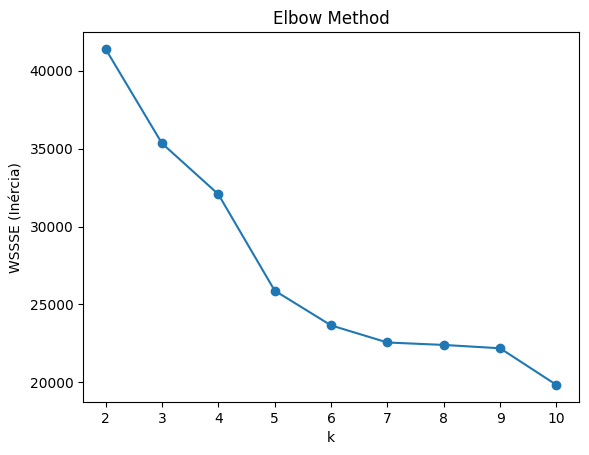

In [0]:
costs = []

for k in range(2, 11):  # test k from 2 to 10
    kmeans = KMeans(featuresCol='prediction', predictionCol="cluster", k=k, maxIter=3)
    model = kmeans.fit(sample_df)
    cost = model.summary.trainingCost  # WSSSE (Inércia)
    costs.append(cost)

# Plot
plt.plot(range(2, 11), costs, marker='o')
plt.xlabel("k")
plt.ylabel("WSSSE (Inércia)")
plt.title("Elbow Method")
plt.show()

In [0]:
kmeans = KMeans(featuresCol="prediction", k=5, predictionCol="cluster", maxIter=10)
model = kmeans.fit(preprocessed_cluster_df)

df_clustered = model.transform(preprocessed_cluster_df)

Uploading artifacts:   0%|          | 0/4 [00:00<?, ?it/s]

🏃 View run serious-calf-959 at: https://community.cloud.databricks.com/ml/experiments/4003234034758612/runs/d682c9adf92147a689157c18637c287d
🧪 View experiment at: https://community.cloud.databricks.com/ml/experiments/4003234034758612


🏃 View run monumental-moose-900 at: https://community.cloud.databricks.com/ml/experiments/4003234034758612/runs/e520d0ac63784849aca18d52dfca87b1
🧪 View experiment at: https://community.cloud.databricks.com/ml/experiments/4003234034758612


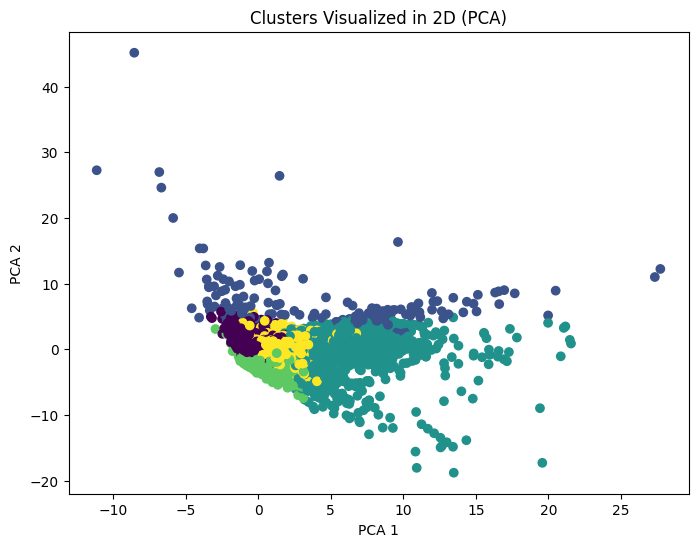

In [0]:
import pandas as pd

# Reduce to 2 dimensions
pca = PCA(k=2, inputCol="prediction", outputCol="plot_features")
pca_model = pca.fit(df_clustered)
df_pca = pca_model.transform(df_clustered)

# Convert to Pandas
pandas_df = df_pca.select("plot_features", "cluster").toPandas()

# Extract PCA components
pandas_df["x"] = pandas_df["plot_features"].apply(lambda vec: vec[0])
pandas_df["y"] = pandas_df["plot_features"].apply(lambda vec: vec[1])

# Plot
plt.figure(figsize=(8,6))
plt.scatter(pandas_df["x"], pandas_df["y"], c=pandas_df["cluster"], cmap="viridis")
plt.xlabel("PCA 1")
plt.ylabel("PCA 2")
plt.title("Clusters Visualized in 2D (PCA)")
plt.show()


/databricks/python/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


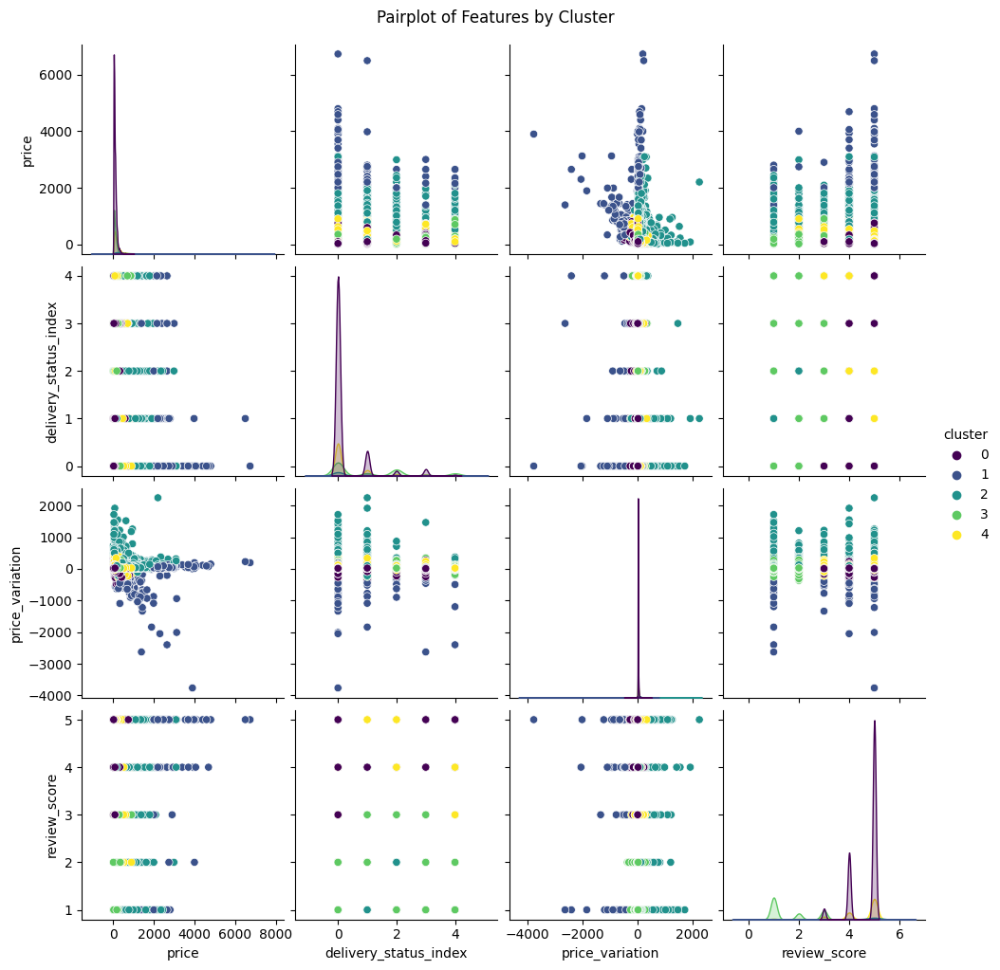

In [0]:
import seaborn as sns

selected_cols = ["price", "delivery_status_index", "price_variation", "review_score", "cluster"]
df_small = df_clustered.select(*selected_cols).toPandas()

# Step 2: Plot with seaborn
sns.pairplot(df_small, hue="cluster", diag_kind="kde", palette="viridis")
plt.suptitle("Pairplot of Features by Cluster", y=1.02)
plt.show()